https://youtu.be/ytlhMAF6ok0

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
cd /content/drive/MyDrive/

/content/drive/MyDrive


# **Custom instance model training using YOLOv8**
<p>
This code walks you through the process of training a custom YOLO v8 model using your own data. Here, I am using a public dataset that shows multiple classes for segmentation. This is the same dataset from tutorial 330 (Detectron2) - https://youtu.be/cEgF0YknpZw

<p>
Dataset from: https://leapmanlab.github.io/dense-cell/
<br>
Direct link to the dataset: https://www.dropbox.com/s/68yclbraqq1diza/platelet_data_1219.zip

**Data courtesy of:**
Guay, M.D., Emam, Z.A.S., Anderson, A.B. et al. ​
Dense cellular segmentation for EM using 2D–3D neural network ensembles. Sci Rep 11, 2561 (2021). ​
<p>
To prepare this dataset for YOLO, the binary masks were converted to the YOLO format. Please follow this tutorial to learn about this process. <br>
(https://youtu.be/NYeJvxe5nYw)

<p>

If you already have annotations in COCO format JSON file, for example by annotating using makesense (https://www.makesense.ai/) then the annotations can be imported to Roboflow for conversion to YOLO format. Otherwise, if you are starting from scratch, just annotate datasets on Roboflow. (https://roboflow.com/). You just need to upload your images along with the JSON file and Roboflow will convert them to any other format, in our case YOLO v8. <p>

For information about YOLO models: <p>
https://docs.ultralytics.com/models/yolov8/#key-features
<p>


**Install the required libraries:**

Let us start by installing ultralytics library. All other libraries should be pre-installed on colab. If you are working on a local system, please make sure you install matplotlib, Pillow, numpy, Seaborn, and roboflow. You may also want to install pandas and other libraries depending on the task.

In [4]:
# Install the ultralytics package using pip
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.1/752.1 kB 6.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [5]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

**Import a model and populate it with pre-trained weights.**
<p>
Here, we are importing an instance segmentation model with weights. For a list of pre-trained models, checkout: https://docs.ultralytics.com/models/yolov8/#key-features

In [6]:
#Instance
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt')  # Transfer the weights from a pretrained model (recommended for training)
model = YOLO('/content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/weights/best.pt')

**Install Roboflow**
<p>
to directly read our training data. For colab, we are going to find a workaround to handle encoding issues by the platform. In fact, we may encounter encoding issues for other tasks in Colab so let's go ahead and run the following cell.  

In [ ]:
#Withut this Colab is giving an error when installing Roboflow
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In case your annotations are on Roboflow, you can directly import the training data using your API key

In [ ]:
#!pip install roboflow --quiet
#%cd /content/

In [ ]:
# To hide your API key from others, you can use getpass
#from getpass import getpass
#token = getpass('Enter Token Here') #I stored my token in a file on my Google Drive. I will enter it when prompted here.

In [ ]:
# Import your data from Roboflow
"""
from roboflow import Roboflow
rf = Roboflow(api_key=token)
project = rf.workspace("python-for-microscopists-nceyk").project("3d-em-platelet")
dataset = project.version(2).download("yolov8")
"""
#Change the working directory to the downloaded data directory and check the yaml file.
#%cd /content/your_dataset

Let us load the YAML file that contains the names of our classes, number of classes and the directories for train, valid, and test datasets, respectively.

In [7]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/drive/MyDrive/Yolo_ds/data.yaml

names:
- Wall
- Building
- Sky
- Floor
- Tree
- Ceiling
- Route
- Bed
- grass
- Person
- House
- bathtub
- toilet
nc: 13
test: ''
train: /content/drive/MyDrive/Yolo_ds/train
val: /content/drive/MyDrive/Yolo_ds/valid


In [8]:
# define number of classes based on YAML
import yaml
with open("/content/drive/MyDrive/Yolo_ds/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

**Train the model**

In [9]:
#Define a project --> Destination directory for all results
project = "/content/drive/MyDrive/Yolo_ds/Results3"
#Define subdirectory for this specific training
name = "200_epochs-3" #note that if you run the training again, it creates a directory: 200_epochs-2

In [ ]:
# Train the model
results = model.train(data='/content/drive/MyDrive/Yolo_ds/data.yaml',
                      project=project,
                      name=name,
                      epochs=100,
                      patience=0, #I am setting patience=0 to disable early stopping.
                      batch=4,
                      imgsz=800)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/Yolo_ds/data.yaml, epochs=100, time=None, patience=0, batch=4, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Yolo_ds/Results2, name=200_epochs-32, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, s

train: Scanning /content/drive/MyDrive/Yolo_ds/train/labels.cache... 918 images, 80 backgrounds, 2 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005005.png: 16 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005006.png: 180 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005010.png: 4 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005011.png: 2 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005012.png: 10 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005013.png: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005014.png: 3 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005015.png: 12 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005016.png: 11 du


val: Scanning /content/drive/MyDrive/Yolo_ds/valid/labels.cache... 750 images, 250 backgrounds, 1 corrupt: 100%|██████████| 1001/1001 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001002.png: 16 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001004.png: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001007.png: 18 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001008.png: 104 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001009.png: 92 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001010.png: 76 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001011.png: 92 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001012.png: 40 duplicate labels removed
val: WARNING ⚠️ /content/drive/MyDrive/Yolo_ds/valid/images/ADE_val_00001013.png: 88 duplicate labels removed
val: WARNI

Plotting labels to /content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.14G      1.177      2.519      1.209      1.238        122        800: 100%|██████████| 250/250 [00:51<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00, 10.02it/s]


                   all       1000      10277      0.252      0.114     0.0785      0.045      0.248      0.108     0.0735     0.0367

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.29G      1.187      2.532      1.242      1.254         17        800: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.96it/s]


                   all       1000      10277       0.23      0.111     0.0713       0.04      0.244     0.0952     0.0649      0.032

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.14G      1.216      2.585      1.291      1.275         23        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.79it/s]


                   all       1000      10277      0.215       0.11     0.0717     0.0396      0.195      0.102     0.0637     0.0311

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.95G      1.239      2.615      1.322      1.279          8        800: 100%|██████████| 250/250 [00:49<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.64it/s]


                   all       1000      10277      0.237      0.119     0.0761     0.0414      0.232      0.107     0.0699     0.0347

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.04G      1.249      2.607       1.33      1.279         18        800: 100%|██████████| 250/250 [00:46<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.89it/s]


                   all       1000      10277      0.233     0.0997     0.0682     0.0374      0.218      0.094     0.0626     0.0314

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.02G      1.243      2.628      1.345      1.287         33        800: 100%|██████████| 250/250 [00:48<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.88it/s]


                   all       1000      10277      0.221      0.104     0.0684     0.0372      0.222     0.0989     0.0632     0.0311

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.02G      1.263      2.631      1.363      1.297         37        800: 100%|██████████| 250/250 [00:48<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.79it/s]


                   all       1000      10277      0.214      0.109     0.0743     0.0415      0.207        0.1     0.0684     0.0342

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.17G      1.241       2.65      1.326      1.292         16        800: 100%|██████████| 250/250 [00:49<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.91it/s]


                   all       1000      10277      0.218      0.106     0.0678     0.0387      0.212     0.0995     0.0629     0.0318

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100       3.1G      1.258      2.638       1.38      1.297         17        800: 100%|██████████| 250/250 [00:49<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.67it/s]


                   all       1000      10277      0.193      0.109     0.0694      0.039      0.186      0.101     0.0628     0.0325

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100         3G      1.249      2.643      1.327      1.276         43        800: 100%|██████████| 250/250 [00:48<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.76it/s]


                   all       1000      10277      0.204      0.112     0.0733     0.0409      0.193      0.105     0.0668     0.0333

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.93G      1.256      2.662      1.317      1.285         83        800: 100%|██████████| 250/250 [00:48<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.81it/s]


                   all       1000      10277      0.212      0.111     0.0727     0.0404      0.206      0.102     0.0659     0.0329

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100         3G      1.248      2.592      1.322      1.279         28        800: 100%|██████████| 250/250 [00:48<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.76it/s]


                   all       1000      10277      0.207      0.118     0.0705     0.0401      0.193       0.11     0.0635      0.033

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100         3G      1.234       2.62      1.316      1.284         17        800: 100%|██████████| 250/250 [00:48<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.73it/s]


                   all       1000      10277      0.215      0.113     0.0762     0.0425      0.208      0.107     0.0696     0.0355

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.18G      1.242      2.623      1.296      1.281          5        800: 100%|██████████| 250/250 [00:48<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.93it/s]


                   all       1000      10277      0.206       0.11      0.072     0.0395      0.195      0.101     0.0662     0.0316

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100       3.1G      1.241      2.608      1.332      1.284         11        800: 100%|██████████| 250/250 [00:49<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.48it/s]


                   all       1000      10277      0.208      0.107     0.0722     0.0419      0.194      0.101     0.0669     0.0348

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.01G       1.24      2.619      1.327      1.291         21        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.88it/s]


                   all       1000      10277      0.235      0.104     0.0731     0.0415      0.234     0.0938     0.0658     0.0344

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.05G       1.22      2.614      1.306       1.28         50        800: 100%|██████████| 250/250 [00:49<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.54it/s]


                   all       1000      10277      0.219     0.0995     0.0699     0.0395      0.224      0.091     0.0654     0.0332

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.18G      1.238      2.604      1.322       1.28         19        800: 100%|██████████| 250/250 [00:48<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.95it/s]


                   all       1000      10277      0.232      0.107     0.0708     0.0391      0.228     0.0986     0.0643     0.0318

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.16G      1.244      2.638      1.332      1.285         18        800: 100%|██████████| 250/250 [00:48<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.76it/s]


                   all       1000      10277      0.237      0.101     0.0694      0.039      0.238     0.0937     0.0633     0.0319

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.08G      1.255      2.615      1.323      1.294         12        800: 100%|██████████| 250/250 [00:47<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.77it/s]


                   all       1000      10277      0.233      0.108     0.0727     0.0411      0.225        0.1     0.0671     0.0349

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.11G      1.212      2.591      1.274      1.269         25        800: 100%|██████████| 250/250 [00:48<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.57it/s]


                   all       1000      10277      0.213      0.112     0.0698     0.0395      0.217        0.1     0.0627     0.0317

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.22G      1.223        2.6      1.286      1.267         29        800: 100%|██████████| 250/250 [00:49<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.67it/s]


                   all       1000      10277      0.229      0.112     0.0718     0.0401      0.219      0.102     0.0648      0.032

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.95G      1.204      2.561      1.281      1.269         30        800: 100%|██████████| 250/250 [00:48<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.80it/s]


                   all       1000      10277      0.209      0.103     0.0671     0.0368      0.202     0.0964     0.0614     0.0301

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.96G       1.22      2.566       1.28      1.277         92        800: 100%|██████████| 250/250 [00:48<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.59it/s]


                   all       1000      10277      0.233      0.106     0.0771     0.0427      0.222        0.1     0.0713     0.0354

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.06G      1.216      2.582      1.261      1.268         32        800: 100%|██████████| 250/250 [00:49<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.70it/s]


                   all       1000      10277      0.243      0.105     0.0719     0.0402      0.232     0.0999      0.066     0.0328

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.24G      1.211      2.529      1.249      1.263         23        800: 100%|██████████| 250/250 [00:48<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.88it/s]


                   all       1000      10277      0.226      0.109     0.0671     0.0361      0.215     0.0975      0.059     0.0292

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100         3G      1.206      2.546      1.243      1.264         52        800: 100%|██████████| 250/250 [00:47<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.60it/s]


                   all       1000      10277      0.226      0.111     0.0734     0.0407      0.223      0.101     0.0674     0.0351

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.18G      1.207       2.55      1.244      1.249         16        800: 100%|██████████| 250/250 [00:49<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.75it/s]


                   all       1000      10277      0.231      0.102     0.0678      0.039      0.218      0.098     0.0637     0.0328

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.11G        1.2      2.544       1.24      1.262         26        800: 100%|██████████| 250/250 [00:48<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.73it/s]


                   all       1000      10277      0.265      0.105     0.0706     0.0395      0.248     0.0982      0.064     0.0326

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.97G      1.196      2.539      1.215      1.258         40        800: 100%|██████████| 250/250 [00:47<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.81it/s]


                   all       1000      10277      0.251       0.11     0.0732     0.0406      0.242      0.101     0.0655     0.0324

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.19G      1.228      2.589       1.26       1.26         17        800: 100%|██████████| 250/250 [00:48<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.96it/s]


                   all       1000      10277       0.25      0.106     0.0728     0.0414       0.24     0.0973     0.0665     0.0346

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.02G      1.205      2.525      1.251      1.261         34        800: 100%|██████████| 250/250 [00:48<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.82it/s]


                   all       1000      10277       0.21      0.106     0.0673     0.0377      0.215     0.0947     0.0618     0.0316

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.02G       1.21      2.553      1.235      1.268         24        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.74it/s]


                   all       1000      10277      0.244      0.106     0.0708     0.0408       0.24      0.101     0.0655     0.0335

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.03G      1.208      2.532       1.23      1.249         35        800: 100%|██████████| 250/250 [00:48<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.68it/s]


                   all       1000      10277      0.233      0.104     0.0683     0.0388      0.224     0.0962     0.0624     0.0315

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.95G      1.182      2.529      1.197      1.234         20        800: 100%|██████████| 250/250 [00:48<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.94it/s]


                   all       1000      10277      0.229      0.111     0.0741     0.0419      0.237     0.0981     0.0674     0.0338

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.04G      1.191      2.516      1.216      1.253         43        800: 100%|██████████| 250/250 [00:48<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.66it/s]


                   all       1000      10277      0.223      0.104     0.0694      0.038      0.208     0.0946      0.063     0.0313

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.01G      1.165      2.495      1.195      1.241         25        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.90it/s]


                   all       1000      10277       0.21      0.108     0.0725     0.0403      0.205     0.0969     0.0657     0.0332

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.98G      1.185       2.53      1.207      1.249         40        800: 100%|██████████| 250/250 [00:49<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.90it/s]


                   all       1000      10277      0.247       0.11     0.0752     0.0428      0.224      0.105     0.0671     0.0342

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100         3G      1.166      2.509      1.199      1.242         57        800: 100%|██████████| 250/250 [00:47<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.85it/s]


                   all       1000      10277       0.23       0.11     0.0725     0.0408      0.203      0.107     0.0651     0.0332

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.07G      1.182      2.496      1.194      1.237         46        800: 100%|██████████| 250/250 [00:49<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.70it/s]


                   all       1000      10277      0.212      0.111     0.0716     0.0407      0.198      0.105     0.0662     0.0334

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.06G      1.173      2.499      1.183      1.233         25        800: 100%|██████████| 250/250 [00:48<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.93it/s]


                   all       1000      10277      0.237      0.115      0.075     0.0416      0.224      0.107      0.068     0.0341

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.96G      1.157      2.458      1.145      1.228         12        800: 100%|██████████| 250/250 [00:47<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.80it/s]


                   all       1000      10277      0.224      0.105     0.0716     0.0405      0.209     0.0984     0.0661     0.0337

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.01G       1.17      2.481      1.167      1.227         20        800: 100%|██████████| 250/250 [00:49<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.87it/s]


                   all       1000      10277       0.26      0.108     0.0756     0.0425      0.253     0.0972     0.0678     0.0348

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.97G       1.17       2.48      1.183       1.23         17        800: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.53it/s]


                   all       1000      10277       0.24      0.105     0.0698     0.0393       0.23     0.0998     0.0637     0.0327

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.08G      1.162       2.47      1.165      1.229         24        800: 100%|██████████| 250/250 [00:49<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.70it/s]


                   all       1000      10277      0.243      0.112     0.0723     0.0405      0.242      0.104     0.0666     0.0344

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.89G      1.189      2.477      1.198      1.253         36        800: 100%|██████████| 250/250 [00:49<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.78it/s]


                   all       1000      10277      0.228      0.108     0.0729     0.0418      0.222     0.0998     0.0685     0.0349

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.05G      1.162      2.522      1.177      1.232         21        800: 100%|██████████| 250/250 [00:48<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.92it/s]


                   all       1000      10277      0.226      0.108     0.0747     0.0419      0.226      0.101     0.0695      0.035

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.05G       1.16      2.477      1.161      1.226         14        800: 100%|██████████| 250/250 [00:49<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.87it/s]


                   all       1000      10277      0.228      0.114     0.0728     0.0411      0.205      0.112     0.0678     0.0345

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.34G      1.162       2.46      1.187      1.239         49        800: 100%|██████████| 250/250 [00:49<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.66it/s]


                   all       1000      10277      0.265     0.0995      0.074     0.0413      0.259     0.0938     0.0683     0.0346

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100       3.1G      1.146      2.432      1.141      1.218         38        800: 100%|██████████| 250/250 [00:48<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.71it/s]


                   all       1000      10277      0.222      0.107     0.0709     0.0395      0.211      0.099     0.0642     0.0313

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.08G      1.152      2.498      1.151      1.221         44        800: 100%|██████████| 250/250 [00:48<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.66it/s]


                   all       1000      10277      0.232      0.108     0.0754      0.043      0.224      0.103     0.0707     0.0363

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.04G      1.155      2.454       1.16      1.219         31        800: 100%|██████████| 250/250 [00:48<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.71it/s]


                   all       1000      10277      0.236      0.105     0.0733     0.0416      0.225     0.0992     0.0679     0.0347

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100       3.2G      1.143      2.433      1.114      1.216         57        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.54it/s]


                   all       1000      10277      0.239       0.11     0.0734     0.0412      0.234      0.102     0.0674     0.0343

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.02G      1.148       2.47      1.134      1.223         84        800: 100%|██████████| 250/250 [00:49<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.77it/s]


                   all       1000      10277      0.239      0.107     0.0695      0.039      0.232      0.101     0.0646     0.0321

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.88G      1.143      2.409      1.114      1.218         42        800: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.75it/s]


                   all       1000      10277       0.25      0.107     0.0753     0.0428      0.239      0.103     0.0693     0.0352

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.06G      1.127      2.416      1.109      1.218         27        800: 100%|██████████| 250/250 [00:49<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.81it/s]


                   all       1000      10277      0.249       0.11     0.0769     0.0433      0.254     0.0987     0.0701     0.0359

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.06G       1.14      2.444      1.112      1.204         43        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.62it/s]


                   all       1000      10277       0.25      0.105     0.0747     0.0421      0.249     0.0998     0.0702     0.0349

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.15G      1.133      2.397      1.108      1.214         60        800: 100%|██████████| 250/250 [00:48<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.78it/s]


                   all       1000      10277       0.24      0.106     0.0748     0.0423      0.232      0.102       0.07     0.0362

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.85G      1.163      2.467      1.131      1.218         63        800: 100%|██████████| 250/250 [00:48<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00, 10.06it/s]


                   all       1000      10277      0.255        0.1     0.0756     0.0432       0.24     0.0949     0.0699     0.0359

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.07G      1.125      2.394      1.099      1.205         25        800: 100%|██████████| 250/250 [00:47<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.44it/s]


                   all       1000      10277      0.226      0.111     0.0761     0.0427       0.22      0.103     0.0703     0.0351

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.91G      1.124      2.432      1.098      1.206         48        800: 100%|██████████| 250/250 [00:48<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.81it/s]


                   all       1000      10277      0.251      0.108     0.0759     0.0417      0.272     0.0975       0.07     0.0344

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.99G      1.116      2.369      1.084      1.191         20        800: 100%|██████████| 250/250 [00:48<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.75it/s]


                   all       1000      10277       0.24      0.109     0.0733     0.0413      0.232      0.103     0.0685     0.0345

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100       3.1G      1.127      2.394      1.107      1.215         27        800: 100%|██████████| 250/250 [00:48<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.95it/s]


                   all       1000      10277      0.254      0.105     0.0756      0.044      0.243      0.101     0.0712     0.0366

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.95G      1.112        2.4      1.086      1.198         32        800: 100%|██████████| 250/250 [00:48<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.84it/s]


                   all       1000      10277      0.239      0.111     0.0746     0.0429      0.241      0.103       0.07     0.0361

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100       3.3G      1.115      2.373      1.084      1.206         66        800: 100%|██████████| 250/250 [00:48<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.69it/s]


                   all       1000      10277      0.223      0.114     0.0764     0.0438      0.226      0.102     0.0699     0.0368

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.03G      1.111      2.402       1.08      1.198         18        800: 100%|██████████| 250/250 [00:49<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.99it/s]


                   all       1000      10277      0.254       0.11     0.0752     0.0431      0.252      0.102     0.0687     0.0359

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100       3.3G      1.105      2.357      1.046      1.181         45        800: 100%|██████████| 250/250 [00:48<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.95it/s]


                   all       1000      10277      0.249      0.103     0.0737     0.0417      0.241     0.0965     0.0681     0.0349

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.01G       1.11      2.374      1.065      1.192         38        800: 100%|██████████| 250/250 [00:49<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.85it/s]


                   all       1000      10277       0.26      0.107      0.075     0.0429      0.265     0.0958     0.0677     0.0352

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.95G      1.112      2.378       1.06      1.198         19        800: 100%|██████████| 250/250 [00:47<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.80it/s]


                   all       1000      10277      0.248       0.11      0.075     0.0422      0.242      0.103     0.0688     0.0355

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.13G      1.088      2.345      1.056       1.18         38        800: 100%|██████████| 250/250 [00:47<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.97it/s]


                   all       1000      10277      0.239      0.111     0.0757     0.0431      0.241      0.102     0.0693     0.0358

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.89G      1.096      2.365      1.041      1.186         19        800: 100%|██████████| 250/250 [00:49<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.92it/s]


                   all       1000      10277      0.233      0.112     0.0776     0.0448      0.242        0.1     0.0711     0.0372

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.22G      1.106      2.386      1.057       1.19        119        800: 100%|██████████| 250/250 [00:48<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.91it/s]


                   all       1000      10277      0.235      0.114      0.077      0.044      0.225      0.109     0.0707     0.0369

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.02G       1.09      2.367      1.048       1.19         22        800: 100%|██████████| 250/250 [00:49<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.71it/s]


                   all       1000      10277       0.26       0.11      0.077     0.0443      0.252      0.102     0.0705     0.0364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.11G      1.101      2.379      1.037      1.175         60        800: 100%|██████████| 250/250 [00:49<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.92it/s]


                   all       1000      10277      0.227      0.115      0.077     0.0441      0.219      0.107      0.071     0.0364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.09G      1.084      2.347      1.032      1.179         20        800: 100%|██████████| 250/250 [00:48<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.98it/s]


                   all       1000      10277      0.243      0.116     0.0784     0.0445      0.226      0.109     0.0713     0.0362

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.98G      1.104      2.358      1.039      1.191         19        800: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.88it/s]


                   all       1000      10277      0.251      0.108     0.0776     0.0443      0.245     0.0964     0.0703     0.0361

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.01G      1.072      2.304      1.022      1.172         46        800: 100%|██████████| 250/250 [00:47<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00, 10.00it/s]


                   all       1000      10277      0.249      0.113     0.0782     0.0445      0.234      0.105     0.0709     0.0371

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.27G      1.098      2.367      1.034       1.18         20        800: 100%|██████████| 250/250 [00:49<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.46it/s]


                   all       1000      10277       0.23      0.117      0.077     0.0439      0.229      0.107     0.0709     0.0365

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.97G      1.085      2.346      1.007      1.178         99        800: 100%|██████████| 250/250 [00:48<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00, 10.00it/s]


                   all       1000      10277      0.264      0.109     0.0797     0.0461      0.252      0.103     0.0737     0.0383

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.97G      1.067      2.314      1.014      1.182         33        800: 100%|██████████| 250/250 [00:48<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.79it/s]


                   all       1000      10277      0.247      0.108     0.0755     0.0431      0.237     0.0974     0.0686     0.0353

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.07G      1.077      2.321      1.024      1.185         15        800: 100%|██████████| 250/250 [00:50<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.69it/s]


                   all       1000      10277       0.24      0.113     0.0789     0.0454      0.226       0.11     0.0728      0.038

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.92G      1.075      2.307      1.001      1.169         36        800: 100%|██████████| 250/250 [00:49<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.90it/s]


                   all       1000      10277      0.264       0.11     0.0793     0.0455      0.239      0.107     0.0722     0.0378

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.99G      1.074      2.339      1.011      1.174         33        800: 100%|██████████| 250/250 [00:49<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.76it/s]


                   all       1000      10277      0.269      0.108     0.0815     0.0472      0.242      0.105     0.0738     0.0391

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.14G      1.063      2.323      1.014      1.166          8        800: 100%|██████████| 250/250 [00:49<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.49it/s]


                   all       1000      10277      0.262       0.11     0.0819     0.0481      0.268     0.0989     0.0763       0.04

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.99G      1.066      2.323      1.004      1.173         18        800: 100%|██████████| 250/250 [00:49<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.61it/s]


                   all       1000      10277      0.252      0.112     0.0805     0.0465      0.241      0.106     0.0742     0.0385

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.11G      1.063      2.298      1.012      1.167         18        800: 100%|██████████| 250/250 [00:49<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.43it/s]


                   all       1000      10277      0.248      0.111     0.0769     0.0445      0.235      0.105     0.0708     0.0363

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.15G      1.082      2.327      1.028      1.177         18        800: 100%|██████████| 250/250 [00:49<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.70it/s]


                   all       1000      10277      0.246      0.114     0.0764      0.044      0.244      0.107     0.0704     0.0364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.21G      1.076      2.315      1.007      1.173          8        800: 100%|██████████| 250/250 [00:51<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.54it/s]


                   all       1000      10277      0.264      0.107     0.0779      0.045      0.255      0.101     0.0721     0.0372

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.02G      1.067      2.297     0.9969      1.163         42        800: 100%|██████████| 250/250 [00:50<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.64it/s]


                   all       1000      10277      0.272      0.106     0.0796     0.0463      0.256      0.103     0.0734     0.0381

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.01G       1.06        2.3      0.991       1.16         35        800: 100%|██████████| 250/250 [00:50<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.40it/s]


                   all       1000      10277      0.254       0.11     0.0777     0.0457       0.24      0.105     0.0717     0.0375
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.98G      1.221      2.456      1.208      1.287         24        800: 100%|██████████| 250/250 [00:32<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.53it/s]


                   all       1000      10277       0.24      0.105     0.0726     0.0414      0.234     0.0982     0.0665     0.0336

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100         3G      1.185      2.395      1.119      1.245          9        800: 100%|██████████| 250/250 [00:31<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.67it/s]


                   all       1000      10277      0.251      0.109     0.0737     0.0421       0.24      0.104     0.0674     0.0341

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.85G      1.171      2.392      1.104      1.242         13        800: 100%|██████████| 250/250 [00:30<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.58it/s]


                   all       1000      10277      0.236      0.109     0.0744     0.0428      0.225      0.104     0.0686     0.0346

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.05G      1.145      2.372      1.065       1.23         12        800: 100%|██████████| 250/250 [00:30<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.69it/s]


                   all       1000      10277       0.23      0.111     0.0754      0.044      0.218      0.105       0.07     0.0359

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.68G      1.169      2.408      1.095      1.247         15        800: 100%|██████████| 250/250 [00:30<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.42it/s]


                   all       1000      10277      0.308      0.114     0.0754     0.0439      0.309      0.104     0.0699     0.0358

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.27G      1.144      2.387      1.054      1.225         44        800: 100%|██████████| 250/250 [00:30<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.73it/s]


                   all       1000      10277      0.249      0.108     0.0755     0.0442      0.246      0.102     0.0699     0.0362

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.85G      1.128      2.339      1.022      1.218         20        800: 100%|██████████| 250/250 [00:30<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.26it/s]


                   all       1000      10277      0.258      0.106     0.0761     0.0444      0.252      0.101     0.0712     0.0364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.98G      1.143      2.367      1.057      1.235          6        800: 100%|██████████| 250/250 [00:29<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.84it/s]


                   all       1000      10277      0.246       0.11     0.0767     0.0448      0.235      0.106      0.071     0.0368

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.95G      1.125      2.316       1.03      1.218         30        800: 100%|██████████| 250/250 [00:30<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.69it/s]


                   all       1000      10277       0.24       0.11     0.0758     0.0445      0.229      0.106     0.0705     0.0364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.86G      1.128      2.336      1.026      1.222          5        800: 100%|██████████| 250/250 [00:30<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:12<00:00,  9.75it/s]


                   all       1000      10277      0.225      0.112     0.0765     0.0448      0.227      0.105     0.0711     0.0368

100 epochs completed in 1.685 hours.
Optimizer stripped from /content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/weights/last.pt, 6.8MB
Optimizer stripped from /content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/weights/best.pt, 6.8MB

Validating /content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
YOLOv8n-seg summary (fused): 195 layers, 3260599 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:13<00:00,  9.55it/s]


                   all       1000      10277      0.263       0.11     0.0819      0.048      0.253      0.103     0.0762     0.0399
                  Wall       1000       2929      0.325      0.121     0.0875      0.046      0.227     0.0813     0.0532     0.0225
              Building       1000       2109      0.386     0.0493     0.0438      0.025      0.379     0.0469     0.0421     0.0207
                   Sky       1000        780      0.324      0.226      0.143     0.0923       0.32      0.215      0.136      0.092
                 Floor       1000       1037      0.305      0.103     0.0841     0.0472      0.301     0.0993     0.0776     0.0413
                  Tree       1000       1212      0.345     0.0809     0.0608     0.0344      0.349     0.0776     0.0622     0.0282
               Ceiling       1000        626      0.318      0.294      0.213      0.104      0.318      0.283      0.206     0.0865
                 Route       1000        304        0.5       0.23   

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

All training curves, metrics, and other results are stored as images in the 'runs' directory. Let us open a couple of these images.

In [ ]:
from IPython.display import Image

In [ ]:
pwd

'/content/drive/MyDrive'

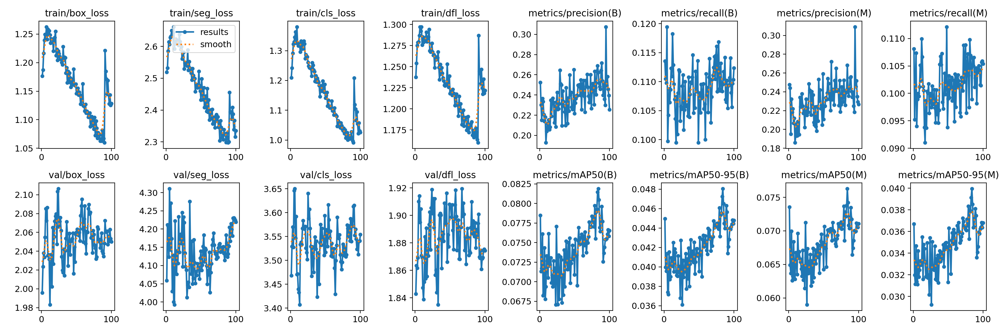

In [ ]:
Image("/content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/results.png")

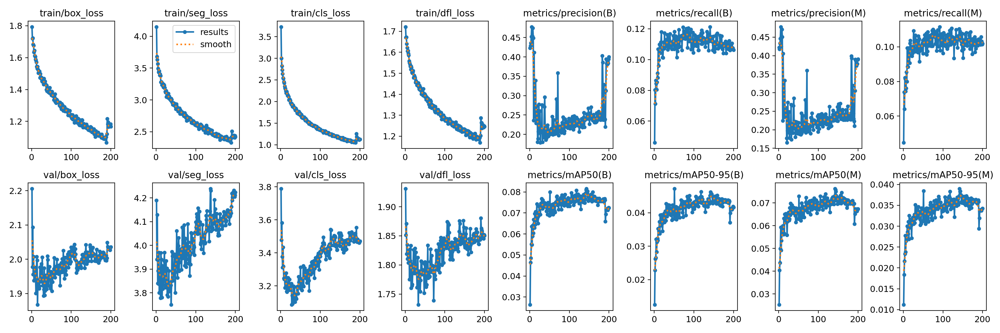

In [ ]:
Image("/content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/results.png")

In [ ]:
Image(filename='/content/drive/MyDrive/ColabNotebooks/data/3D-EM-Platelet/YOLOV8-data/results/200_epochs-4/train_batch572.jpg', width=900)

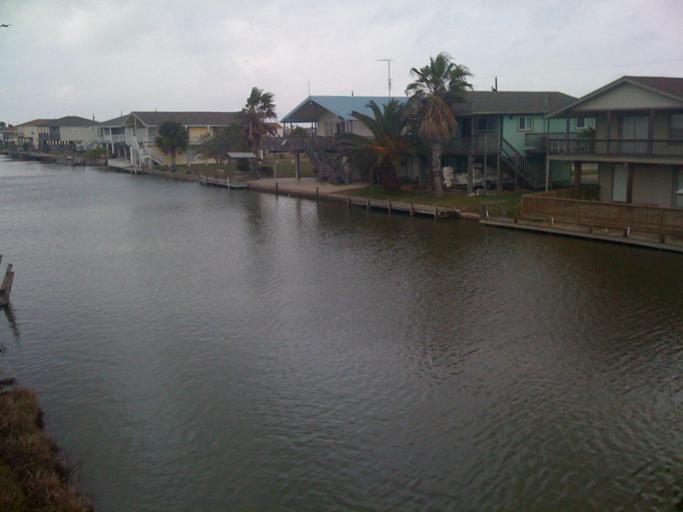

In [ ]:
Image(filename='/content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005005.png', width=900)


**Run inference**

Now that our model is trained, we can use it for inference.

In [ ]:
#List the saved models in 'runs' directory. Note that you will see multiple 'train' subdirectories numbered 1, 2, 3, etc. The exact number depends on the number of epochs.
%ls /content/drive/MyDrive/Grad_Project/Yolo_ds/Results/200_epochs-2/weights

ls: cannot access '/content/drive/MyDrive/Grad_Project/Yolo_ds/Results/200_epochs-2/weights': No such file or directory


You can load the best model or the latest. I am picking the latest.

In [10]:
my_new_model = YOLO('/content/drive/MyDrive/Yolo_ds/Results2/200_epochs-32/weights/best.pt')

In [ ]:
new_image2 = '/content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005005.png'
new_results2 = my_new_model.predict(new_image2, conf=0.4)  #Adjust conf threshold



image 1/1 /content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00005005.png: 608x800 1 Sky, 5 Houses, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 7.1ms postprocess per image at shape (1, 3, 608, 800)


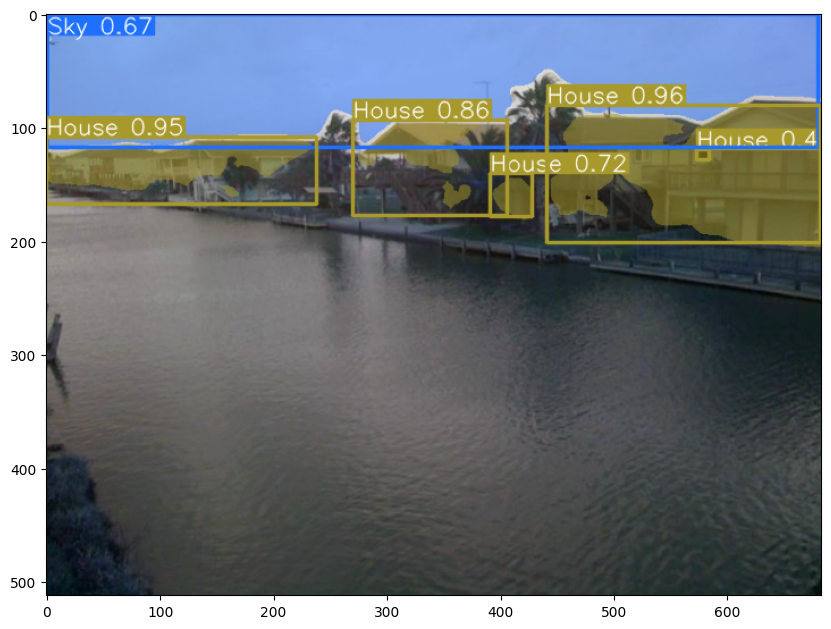

In [ ]:
new_result_array2 = new_results2[0].plot()
plt.figure(figsize=(10, 10))
plt.imshow(new_result_array2)

In [ ]:
/content/drive/MyDrive/Yolo_ds/train/images/ADE_train_00006001.png

NameError: name 'content' is not defined

Load an image and perform inference (segmentation).

In [ ]:
new_image = '/content/drive/MyDrive/Grad_Project/ADE/ADEChallengeData2016/images/validation/ADE_val_00000001.jpg'
new_results = my_new_model.predict(new_image, conf=0.4)  #Adjust conf threshold



image 1/1 /content/drive/MyDrive/Grad_Project/ADE/ADEChallengeData2016/images/validation/ADE_val_00000001.jpg: 608x800 1 Building, 1 Sky, 1 grass, 17.4ms
Speed: 3.0ms preprocess, 17.4ms inference, 4.8ms postprocess per image at shape (1, 3, 608, 800)


The results are stored in a variable 'new_results'. Since we only have one image for segmentation, we will only have one set of results. Therefore, let us work with that one result.

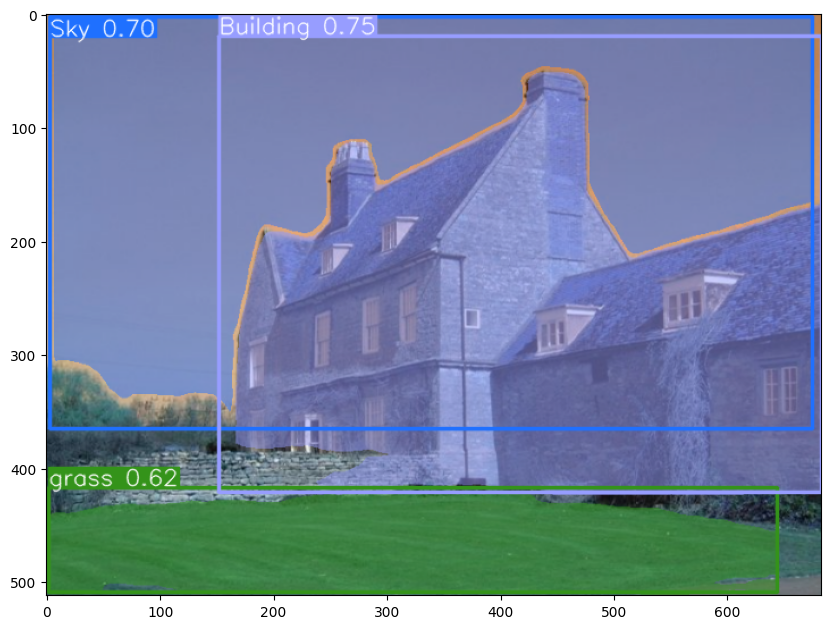

In [ ]:
new_result_array = new_results[0].plot()
plt.figure(figsize=(10, 10))
plt.imshow(new_result_array)

**Extracting bounding boxes and segmented masks from the result**

In [ ]:
new_result = new_results[0]

In [ ]:
new_result

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Wall', 1: 'Building', 2: 'Sky', 3: 'Floor', 4: 'Tree', 5: 'Ceiling', 6: 'Route', 7: 'Bed', 8: 'grass', 9: 'Person', 10: 'House', 11: 'bathtub', 12: 'toilet'}
obb: None
orig_img: array([[[186, 138,  86],
        [185, 137,  85],
        [187, 137,  85],
        ...,
        [186, 129,  78],
        [186, 129,  78],
        [186, 129,  78]],

       [[186, 138,  86],
        [185, 137,  85],
        [187, 137,  85],
        ...,
        [186, 129,  78],
        [186, 129,  78],
        [186, 129,  78]],

       [[186, 138,  86],
        [185, 137,  85],
        [187, 137,  85],
        ...,
        [186, 129,  78],
        [186, 129,  78],
        [186, 129,  78]],

       ...,

       [[ 55,  96,  89],
        [ 58,  99,  92],
        [ 58,  99,  92],
        ...,
        [104, 111, 114],
        [104, 111, 

**Extracting bounding polygons** <p>
Use 'Masks.xyn' for segments (normalized) and 'Masks.xy' for segments (pixels)

In [ ]:
new_result.masks.xyn

[array([[    0.63625,    0.099805],
        [      0.635,     0.10147],
        [     0.6325,     0.10147],
        ...,
        [    0.67375,     0.10147],
        [    0.66875,     0.10147],
        [     0.6675,    0.099805]], dtype=float32),
 array([[    0.01125,   0.0064258],
        [       0.01,   0.0080933],
        [       0.01,     0.58838],
        ...,
        [    0.98875,     0.31658],
        [    0.98875,   0.0080933],
        [     0.9875,   0.0064258]], dtype=float32),
 array([[       0.45,     0.82182],
        [    0.44875,     0.82349],
        [    0.44625,     0.82349],
        [      0.445,     0.82516],
        [     0.3825,     0.82516],
        [    0.38125,     0.82683],
        [    0.37375,     0.82683],
        [     0.3725,     0.82516],
        [    0.35875,     0.82516],
        [     0.3575,     0.82683],
        [    0.34375,     0.82683],
        [     0.3425,     0.82849],
        [    0.33125,     0.82849],
        [       0.33,     0.83016],
    

**Extracting segmented masks**

In [ ]:
extracted_masks = new_result.masks.data

In [ ]:
extracted_masks.shape

torch.Size([3, 608, 800])

Push the mask to cpu (from GPU) and convert to numpy array for easy plotting.

In [ ]:
masks_array = extracted_masks.cpu().numpy()

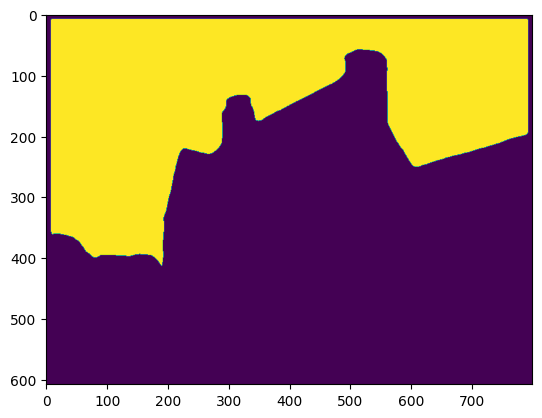

In [ ]:
plt.imshow(masks_array[1])

**Extracting labels for each class**

In [ ]:
class_names = new_result.names.values()
class_names

dict_values(['Wall', 'Building', 'Sky', 'Floor', 'Tree', 'Ceiling', 'Route', 'Bed', 'grass', 'Person', 'House', 'bathtub', 'toilet'])

In [ ]:
# Extract the boxes, which likely contain class IDs
detected_boxes = new_result.boxes.data
# Extract class IDs from the detected boxes
class_labels = detected_boxes[:, -1].int().tolist()
# Initialize a dictionary to hold masks by class
masks_by_class = {name: [] for name in new_result.names.values()}

# Iterate through the masks and class labels
for mask, class_id in zip(extracted_masks, class_labels):
    class_name = new_result.names[class_id]  # Map class ID to class name
    masks_by_class[class_name].append(mask.cpu().numpy())

In [ ]:
for class_name, masks in masks_by_class.items():
    print(f"Class Name: {class_name}, Number of Masks: {len(masks)}")


Class Name: Wall, Number of Masks: 0
Class Name: Building, Number of Masks: 1
Class Name: Sky, Number of Masks: 1
Class Name: Floor, Number of Masks: 0
Class Name: Tree, Number of Masks: 0
Class Name: Ceiling, Number of Masks: 0
Class Name: Route, Number of Masks: 0
Class Name: Bed, Number of Masks: 0
Class Name: grass, Number of Masks: 1
Class Name: Person, Number of Masks: 0
Class Name: House, Number of Masks: 0
Class Name: bathtub, Number of Masks: 0
Class Name: toilet, Number of Masks: 0


**Extracting masks for a specific class**

In [ ]:
alpha_granule_masks = masks_by_class['Wall']
cell_masks = masks_by_class['Sky']

In [ ]:
# Extract the original image
orig_img = new_result.orig_img

In [ ]:
orig_img.shape

(512, 683, 3)

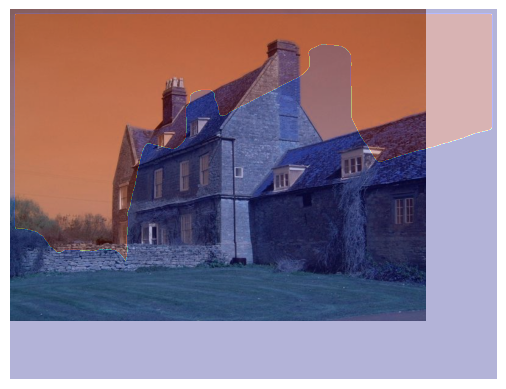

In [ ]:
# Display the original image
plt.imshow(orig_img, cmap='gray')

# Overlay the mask with some transparency
#plt.imshow(alpha_granule_masks[1], cmap='jet', alpha=0.3)
plt.imshow(cell_masks[0], cmap='jet', alpha=0.3)
plt.axis('off') # Turn off axis labels
plt.show()

**Calculating region properties for all objects and saving to a csv file.**

In [ ]:
import pandas as pd
from skimage.measure import regionprops

# Initialize a list to store the properties
props_list = []

# Iterate through all classes
for class_name, masks in masks_by_class.items():
    # Iterate through the masks for this class
    for mask in masks:
        # Convert the mask to an integer type if it's not already
        mask = mask.astype(int)

        # Apply regionprops to the mask
        props = regionprops(mask)

        # Extract the properties you want (e.g., area, perimeter) and add them to the list
        for prop in props:
            area = prop.area
            perimeter = prop.perimeter
            # Add other properties as needed

            # Append the properties and class name to the list
            props_list.append({'Class Name': class_name, 'Area': area, 'Perimeter': perimeter})

# Convert the list of dictionaries to a DataFrame
props_df = pd.DataFrame(props_list)

# Now props_df contains the properties and class names for all regions

# Save the DataFrame to a CSV file
props_df.to_csv('/content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/results.csv', index=False)

In [ ]:
props_df

,Class Name,Area,Perimeter
0,Building,180503,2543.816413
1,Sky,169489,2647.945310
2,Tree,10897,528.107648
3,grass,69140,1950.410209


**Plotting results**

In [ ]:
import seaborn as sns


**Swarm plot**

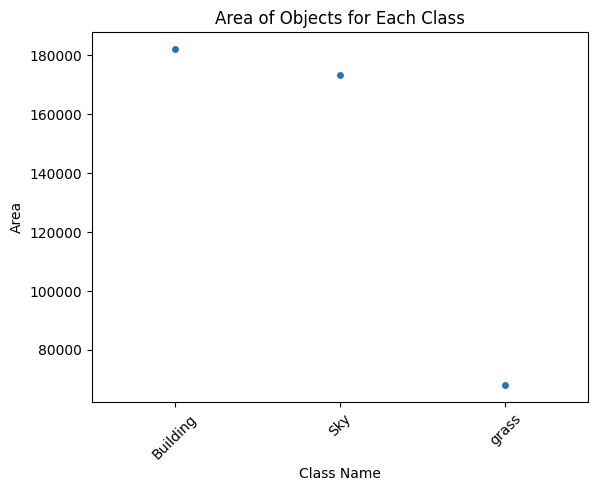

In [ ]:

# Create the swarm plot with Seaborn
sns.swarmplot(x='Class Name', y='Area', data=props_df)

# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Box Plot**

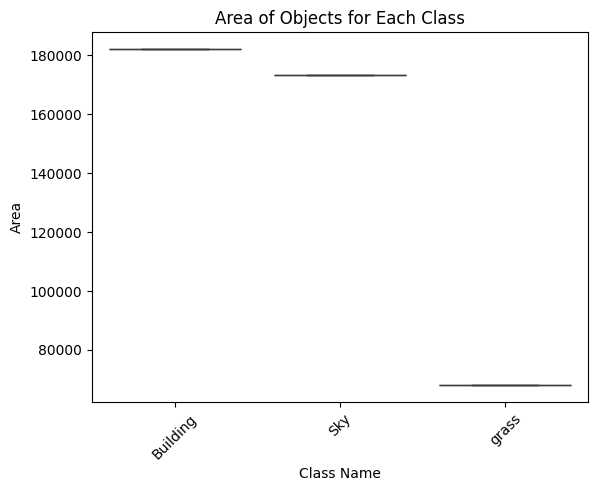

In [ ]:
sns.boxplot(x='Class Name', y='Area', data=props_df)
# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Export model to ONNX for deployment.**

In [ ]:
# Export the model
my_new_model.export(format='onnx', imgsz=[800,800])


Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from '/content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/weights/last.pt' with input shape (1, 3, 800, 800) BCHW and output shape(s) ((1, 49, 13125), (1, 32, 200, 200)) (6.5 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 138.3 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 7.4s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.16.0 opset 17...
ONNX: export success ✅ 8.4s, saved as '/content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/weights/last.onnx' (12.7 MB)

Export complete (9.9s)
Results saved to /content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/weights
Predict:         yolo predict task=segment model=/content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/weights/last.

'/content/drive/MyDrive/Yolo_ds/Results/200_epochs-2/weights/last.onnx'